# **Projet Machine Learning : Text to Speech**
Réalisé par : Bendoudou Eya
              Lassoued Abir

# About
___

-  Bark is a transformer-based text-to-audio model created by Suno. Bark can generate highly realistic, multilingual speech as well as other audio - including music, background noise and simple sound effects.
- TTS model is an AI model that converts text to natural sounding spoken text.
- Bark is a multilingual model.
- Bark is open source and available for commercial use.
- This is a study about TTS (Text-To-Speech) generation with Bark.


In [ ]:
! nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0


In [ ]:
! nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-d9469602-d481-6716-7952-cfe7868d0c52)


# Imports

In [ ]:
%%time

from IPython.display import clear_output

! pip install -U accelerate -qq # for inference time optimization (enable_cpu_offload)

clear_output()

CPU times: user 53.9 ms, sys: 11 ms, total: 64.9 ms
Wall time: 8.89 s


In [ ]:
import warnings
warnings.filterwarnings('ignore')

import time
import gc
import re

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.io.wavfile import write # to save audios

### HF
from transformers import AutoProcessor, AutoModel

### torch
import torch
from torchaudio.transforms import Resample
import torchaudio

### audio
from IPython.display import Audio

In [ ]:
import transformers
print('transformers version: ', transformers.__version__)
print('torch version: ', torch.__version__)

transformers version:  4.47.1
torch version:  2.5.1+cu121


# CFG

- [Bark Speaker Library](https://suno-ai.notion.site/8b8e8749ed514b0cbf3f699013548683?v=bc67cff786b04b50b3ceb756fd05f68c). Choose your speaker and language from here.
- There are many languages and speakers available.
- To do TTS in another supported language, just change the text to that language and adjust the Speaker in `CFG class`.

In [ ]:
class CFG:
    DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

    ### processor
    SPEAKER = "v2/en_speaker_0" # voice preset

    ### model
    MODEL_NAME = 'suno/bark'

    ### post-processing: to visualize and remove Noise
    AMPLITUDE_THRESHOLD = 0.05
    TIME_THRESHOLD = int(24_000 * 0.5) # sample_rate * n_seconds
    IGNORE_INITIAL_STEPS = int(24_000 * 0.5) # sample_rate * n_seconds

# 📝 Text

In Greek mythology, there are multiple stories associated with the constellation Cancer, but one prominent tale involves the second labor of Heracles (Hercules in Roman mythology). Hera, the wife of Zeus and the goddess of marriage, held a grudge against Heracles because he was the illegitimate son of Zeus and another woman. To harm Heracles, Hera sent a giant crab named Karkinos to distract him during his battle with the Hydra, a serpent with multiple heads.

As Heracles was fighting the Hydra, Karkinos latched onto his foot with its strong pincers. However, Heracles quickly crushed the crab with his foot, killing it. In recognition of Karkinos' loyalty and sacrifice, Hera placed the crab in the night sky as the constellation Cancer. This was her way of honoring the creature that tried to thwart Heracles in his quest. The Cancer constellation is often depicted as a crab in various interpretations of this myth.

In [ ]:
### choose text to make inference on
text_to_infer = '''
In Greek mythology, there are multiple stories associated with the constellation Cancer, but one prominent tale involves the second labor of Heracles (Hercules in Roman mythology). Hera, the wife of Zeus and the goddess of marriage, held a grudge against Heracles because he was the illegitimate son of Zeus and another woman. To harm Heracles, Hera sent a giant crab named Karkinos to distract him during his battle with the Hydra, a serpent with multiple heads.

As Heracles was fighting the Hydra, Karkinos latched onto his foot with its strong pincers. However, Heracles quickly crushed the crab with his foot, killing it. In recognition of Karkinos' loyalty and sacrifice, Hera placed the crab in the night sky as the constellation Cancer. This was her way of honoring the creature that tried to thwart Heracles in his quest. The Cancer constellation is often depicted as a crab in various interpretations of this myth.

'''

In [ ]:
len(text_to_infer)

927

#  Bark Model

- Instantiate [Processor](https://huggingface.co/docs/transformers/v4.36.1/en/model_doc/bark#transformers.BarkProcessor) and [Model](https://huggingface.co/docs/transformers/v4.36.1/en/model_doc/bark#transformers.BarkModel)
- Choose voice to be used: voice_preset parameter (CFG class)

In [ ]:
%%time

processor = AutoProcessor.from_pretrained(
    CFG.MODEL_NAME,
    voice_preset = CFG.SPEAKER,
    return_tensors = 'pt'
)
model = AutoModel.from_pretrained(
    CFG.MODEL_NAME,
    torch_dtype = torch.float16, # half-precision
).to(CFG.DEVICE);

### inference optimization with accelerate
model.enable_cpu_offload()

clear_output()

CPU times: user 10 s, sys: 12.2 s, total: 22.2 s
Wall time: 1min


In [ ]:
### bark architecture
model.eval()

BarkModel(
  (semantic): BarkSemanticModel(
    (input_embeds_layer): Embedding(129600, 1024)
    (position_embeds_layer): Embedding(1024, 1024)
    (drop): Dropout(p=0.0, inplace=False)
    (layers): ModuleList(
      (0-23): 24 x BarkBlock(
        (layernorm_1): BarkLayerNorm()
        (layernorm_2): BarkLayerNorm()
        (attn): BarkSelfAttention(
          (attn_dropout): Dropout(p=0.0, inplace=False)
          (resid_dropout): Dropout(p=0.0, inplace=False)
          (att_proj): Linear(in_features=1024, out_features=3072, bias=False)
          (out_proj): Linear(in_features=1024, out_features=1024, bias=False)
        )
        (mlp): BarkMLP(
          (in_proj): Linear(in_features=1024, out_features=4096, bias=False)
          (out_proj): Linear(in_features=4096, out_features=1024, bias=False)
          (dropout): Dropout(p=0.0, inplace=False)
          (gelu): GELU(approximate='none')
        )
      )
    )
    (layernorm_final): BarkLayerNorm()
    (lm_head): Linear(in_feat

In [ ]:
from torch.nn import Parameter

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad) + \
           sum(p.numel() for p in model.parameters() if not p.requires_grad and isinstance(p, Parameter))

n_params = count_parameters(model)
n_params
### suno/bark: 1 B params
### suno/bark-small: 410 M params

1100590818

# Prepare input

- Bark  performs best when it is fed one sentence at a time.
- If we feed the processor with a text that has more than 2 sentences, there is a good chance that the model will get confused and speak an alien language.


- So after inference, we will need to post-process some audios that were 'padded' to his length.

___


- We can feed many sentences at a time in a list, and the inference time is much better this way. But the output quality degrades a lot.
- Although slower, calling the processor and the model at each sentence is the best option to optimize for output quality.
- If we feed one sentence at a time we will also have minimum noise, if any, to post-process after inference, so this is a huge plus as well.

In [ ]:
def count_tokens(text, processor = processor):
    return len(processor.tokenizer(text)['input_ids'])

In [ ]:
total_tokens = count_tokens(text_to_infer, processor = processor)
total_tokens

210

In [ ]:
def split_sentences(text):
    '''
    Given a text, return a list of sentences.
    '''
    ### Split on '. ', '.\n', '.\n\n', '!', '?', and ';'
    sentences = re.split(r'\. |\.\n|\.\n\n|!|\?|;', text)

    ### Strip whitespace from each sentence
    sentences = [
        sentence.strip() + '..'
        for sentence in sentences
    ]

    ### Remove empty strings from the list of sentences
    sentences = list(filter(None, sentences))

    number_of_sentences = len(sentences)

    return sentences[:-1], number_of_sentences - 1

In [ ]:
### testing function
sentences, number_of_sentences = split_sentences(text = text_to_infer)
print(f'Sentences: \n {sentences}')
print(f'\n\nNumber of sentences: {number_of_sentences}')

Sentences: 
 ['In Greek mythology, there are multiple stories associated with the constellation Cancer, but one prominent tale involves the second labor of Heracles (Hercules in Roman mythology)..', 'Hera, the wife of Zeus and the goddess of marriage, held a grudge against Heracles because he was the illegitimate son of Zeus and another woman..', 'To harm Heracles, Hera sent a giant crab named Karkinos to distract him during his battle with the Hydra, a serpent with multiple heads..', 'As Heracles was fighting the Hydra, Karkinos latched onto his foot with its strong pincers..', 'However, Heracles quickly crushed the crab with his foot, killing it..', "In recognition of Karkinos' loyalty and sacrifice, Hera placed the crab in the night sky as the constellation Cancer..", 'This was her way of honoring the creature that tried to thwart Heracles in his quest..', 'The Cancer constellation is often depicted as a crab in various interpretations of this myth..']


Number of sentences: 8


# Inference

- For each sentence we want to visualize and analyse its wave together with its audio and text.
- We try to discover noise patterns that we can remove later.
- This will help understand how we can post-process the model predictions to improve quality.


Sentences in this text:
 ['In Greek mythology, there are multiple stories associated with the constellation Cancer, but one prominent tale involves the second labor of Heracles (Hercules in Roman mythology)..', 'Hera, the wife of Zeus and the goddess of marriage, held a grudge against Heracles because he was the illegitimate son of Zeus and another woman..', 'To harm Heracles, Hera sent a giant crab named Karkinos to distract him during his battle with the Hydra, a serpent with multiple heads..', 'As Heracles was fighting the Hydra, Karkinos latched onto his foot with its strong pincers..', 'However, Heracles quickly crushed the crab with his foot, killing it..', "In recognition of Karkinos' loyalty and sacrifice, Hera placed the crab in the night sky as the constellation Cancer..", 'This was her way of honoring the creature that tried to thwart Heracles in his quest..', 'The Cancer constellation is often depicted as a crab in various interpretations of this myth..']

Number of senten

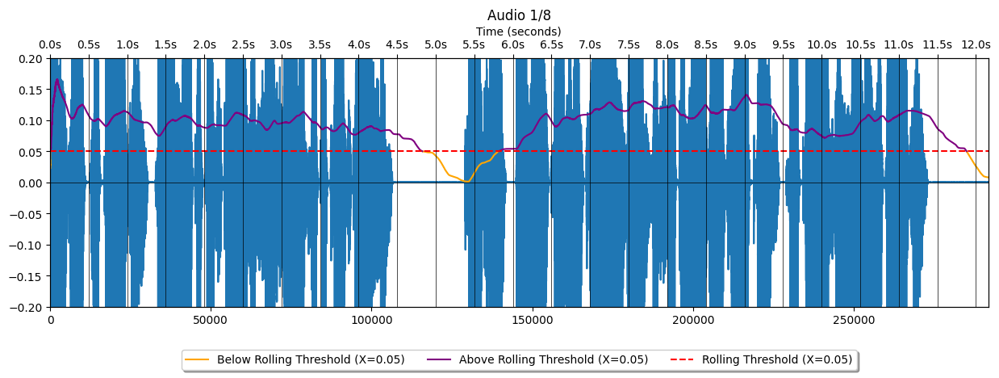

Processing sentence 2/8...

          Sentence 2/8 processed:
          	Number of tokens in sentence: 38
          	Length of sentence: 146
          	Number of sentences in text: 8
          	Shape of tensor for this sentence: torch.Size([1, 208640])
          	Elapsed time for this sentence: 38.36 s
          	Estimated time to complete: 5.15 min
          
Hera, the wife of Zeus and the goddess of marriage, held a grudge against Heracles because he was the illegitimate son of Zeus and another woman..


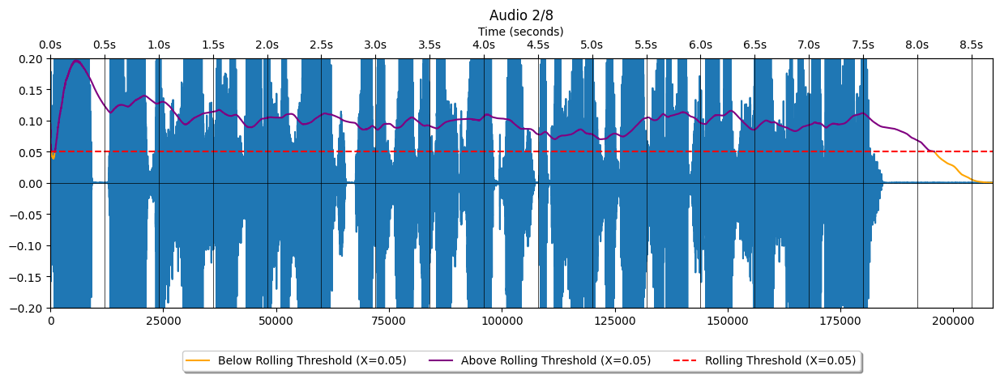

Processing sentence 3/8...

          Sentence 3/8 processed:
          	Number of tokens in sentence: 36
          	Length of sentence: 137
          	Number of sentences in text: 8
          	Shape of tensor for this sentence: torch.Size([1, 226240])
          	Elapsed time for this sentence: 44.51 s
          	Estimated time to complete: 4.1 min
          
To harm Heracles, Hera sent a giant crab named Karkinos to distract him during his battle with the Hydra, a serpent with multiple heads..


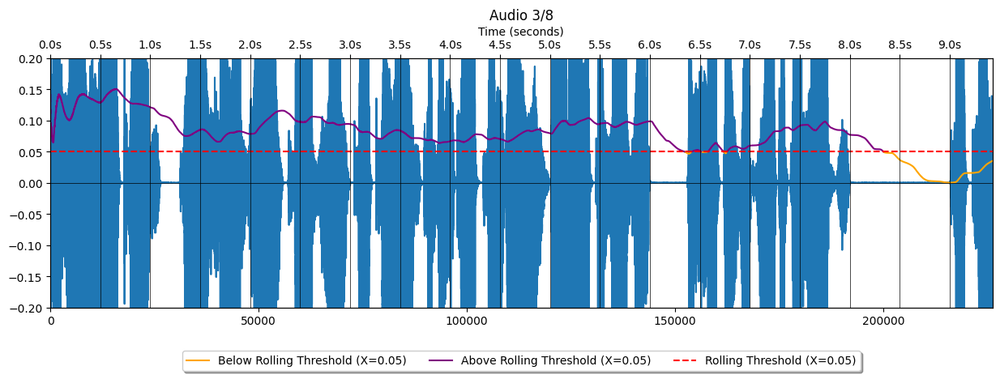

Processing sentence 4/8...

          Sentence 4/8 processed:
          	Number of tokens in sentence: 26
          	Length of sentence: 92
          	Number of sentences in text: 8
          	Shape of tensor for this sentence: torch.Size([1, 169280])
          	Elapsed time for this sentence: 31.88 s
          	Estimated time to complete: 2.99 min
          
As Heracles was fighting the Hydra, Karkinos latched onto his foot with its strong pincers..


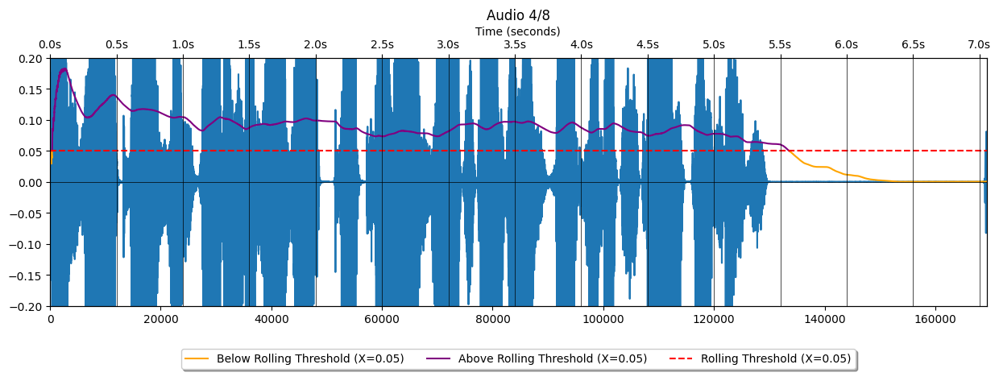

Processing sentence 5/8...

          Sentence 5/8 processed:
          	Number of tokens in sentence: 21
          	Length of sentence: 70
          	Number of sentences in text: 8
          	Shape of tensor for this sentence: torch.Size([1, 170240])
          	Elapsed time for this sentence: 31.84 s
          	Estimated time to complete: 2.11 min
          
However, Heracles quickly crushed the crab with his foot, killing it..


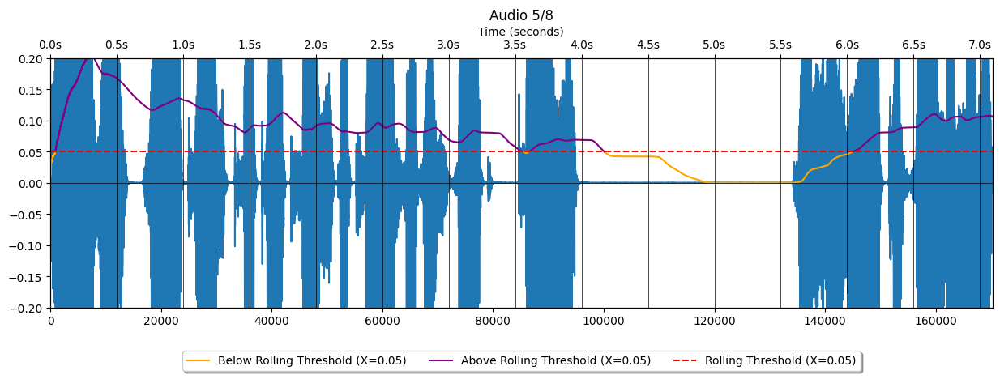

Processing sentence 6/8...

          Sentence 6/8 processed:
          	Number of tokens in sentence: 29
          	Length of sentence: 118
          	Number of sentences in text: 8
          	Shape of tensor for this sentence: torch.Size([1, 195200])
          	Elapsed time for this sentence: 35.26 s
          	Estimated time to complete: 1.37 min
          
In recognition of Karkinos' loyalty and sacrifice, Hera placed the crab in the night sky as the constellation Cancer..


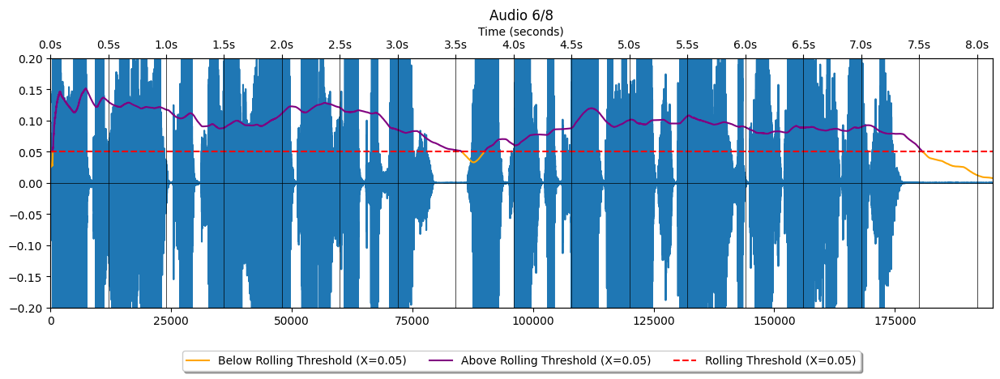

Processing sentence 7/8...

          Sentence 7/8 processed:
          	Number of tokens in sentence: 23
          	Length of sentence: 86
          	Number of sentences in text: 8
          	Shape of tensor for this sentence: torch.Size([1, 146880])
          	Elapsed time for this sentence: 27.51 s
          	Estimated time to complete: 0.65 min
          
This was her way of honoring the creature that tried to thwart Heracles in his quest..


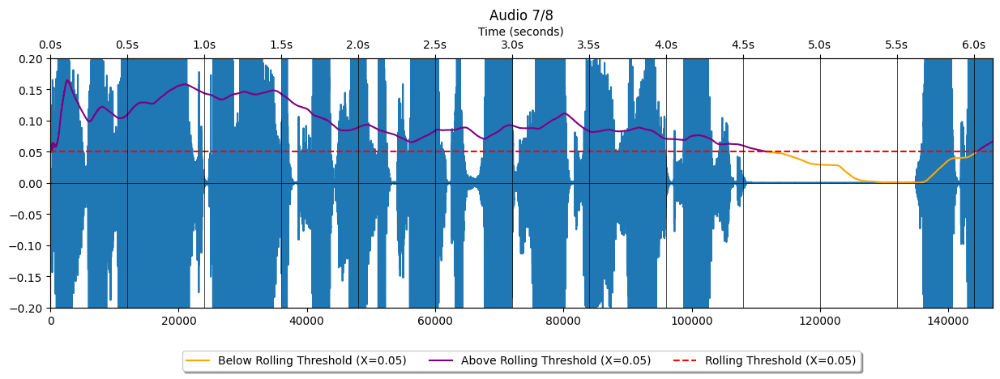

Processing sentence 8/8...

          Sentence 8/8 processed:
          	Number of tokens in sentence: 23
          	Length of sentence: 94
          	Number of sentences in text: 8
          	Shape of tensor for this sentence: torch.Size([1, 146880])
          	Elapsed time for this sentence: 27.17 s
          	Estimated time to complete: 0.0 min
          
The Cancer constellation is often depicted as a crab in various interpretations of this myth..


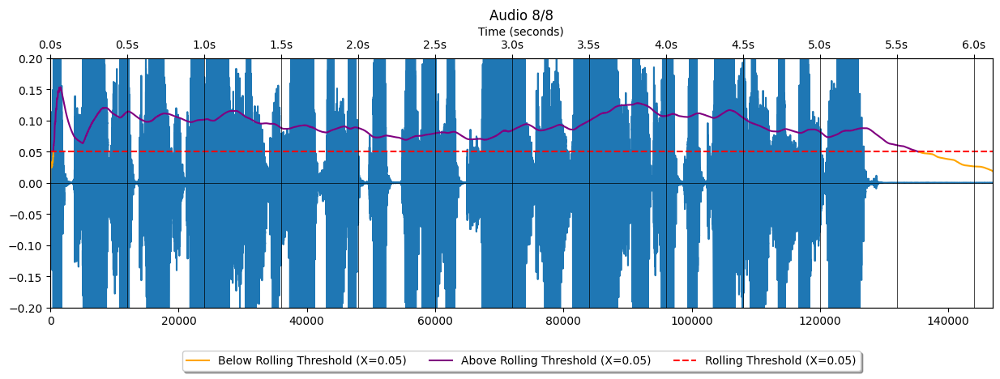

CPU times: user 4min 46s, sys: 10.4 s, total: 4min 56s
Wall time: 5min 10s


In [ ]:
%%time

### prepare list of sentences
sentences, number_of_sentences = split_sentences(text=text_to_infer)
print(f'\nSentences in this text:\n {sentences}')
print(f'\nNumber of sentences in this text: {number_of_sentences}\n')

all_audio_arrays = []
all_times = []

### inference per sentence
for sentence_number in range(number_of_sentences):

    current_sentence = sentences[sentence_number]

    print(f'Processing sentence {sentence_number + 1}/{number_of_sentences}...')

    start_time = time.time()

    ### prepare input for the model, call the processor for the current sentence only
    inputs = processor(
        text=current_sentence,
        return_tensors="pt",
        return_attention_mask=True,
        max_length=1024,
        voice_preset=CFG.SPEAKER,
        add_special_tokens=False,
    ).to(CFG.DEVICE)  # Move inputs to the desired device

    ### count tokens
    n_tokens = count_tokens(current_sentence)

    ### model inference
    with torch.inference_mode():
        # Move history_prompt to the desired device if it exists
        if 'history_prompt' in inputs:
            inputs['history_prompt'] = inputs['history_prompt'].to(CFG.DEVICE)
        result = model.generate(
            **inputs,
            do_sample=True,
            semantic_max_new_tokens=1024,
            pad_token_id=processor.tokenizer.pad_token_id,
        )

    ### save results
    all_audio_arrays.append(result.cpu().numpy())
    elapsed_time = round((time.time() - start_time), 2)
    all_times.append(elapsed_time)

    sentences_left_to_processs = number_of_sentences - (sentence_number + 1)
    average_time = np.array(all_times).mean()
    time_to_complete = round((sentences_left_to_processs * average_time) / 60, 2)  # in minutes

    print(f'''
          Sentence {sentence_number + 1}/{number_of_sentences} processed:
          \tNumber of tokens in sentence: {n_tokens}
          \tLength of sentence: {len(current_sentence)}
          \tNumber of sentences in text: {number_of_sentences}
          \tShape of tensor for this sentence: {result.size()}
          \tElapsed time for this sentence: {elapsed_time} s
          \tEstimated time to complete: {time_to_complete} min
          ''')

    sample_rate = model.generation_config.sample_rate  # 24_000

    result_array = result.cpu().numpy()
    result_len = result_array.shape[-1]

    fig, ax1 = plt.subplots(figsize=(15, 4))
    ax2 = ax1.twiny()
    print(current_sentence)

    ### plot audio array for this sentence
    values = result_array.ravel()
    display(Audio(data=values, rate=sample_rate))
    ax1.plot(values)

    ### calculate rolling amplitude Series
    rolling_window_size = sample_rate  # 24_000
    rolling_amplitude = pd.Series(np.abs(values)).rolling(window=rolling_window_size, min_periods=1).mean()

    ### plot the rolling amplitude Series with colors based on the rolling amplitude threshold
    rolling_threshold = CFG.AMPLITUDE_THRESHOLD  # 0.05
    ax1.plot(np.where(rolling_amplitude < rolling_threshold, rolling_amplitude, np.nan), color='orange',
             label=f'Below Rolling Threshold (X={rolling_threshold})')
    ax1.plot(np.where(rolling_amplitude >= rolling_threshold, rolling_amplitude, np.nan), color='purple',
             label=f'Above Rolling Threshold (X={rolling_threshold})')
    ax1.axhline(y=rolling_threshold, color='red', linestyle='--', label=f'Rolling Threshold (X={rolling_threshold})')

    ### plot auxiliary X axis with Time in seconds: half-second positions
    half_second_positions = np.arange(0, result_len, sample_rate // 2)
    ax2.set_xticks(half_second_positions)
    ax2.set_xticklabels([f'{t:.1f}s' for t in half_second_positions / sample_rate])
    ax2.set_xlabel('Time (seconds)')
    for position in half_second_positions:
        plt.axvline(x=position, color='black', linestyle='-', linewidth=0.5)

    ### plot design
    ax1.axhline(0, color='black', linestyle='-', linewidth=0.5)
    ax1.set_xlim(0, result_array.shape[-1])
    ax2.set_xlim(0, result_array.shape[-1])
    ax1.set_ylim(-0.20, 0.20)
    ax1.set_title(f'Audio {sentence_number + 1}/{number_of_sentences}')
    ax1.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), fancybox=True, shadow=True, ncol=3)
    plt.show()

    del result
    gc.collect()

# Time

- Average processing time per sentence (in seconds)

In [ ]:
avg_time = np.array(all_times).mean().round(2) # average time per sentence (in seconds)
avg_time

37.65

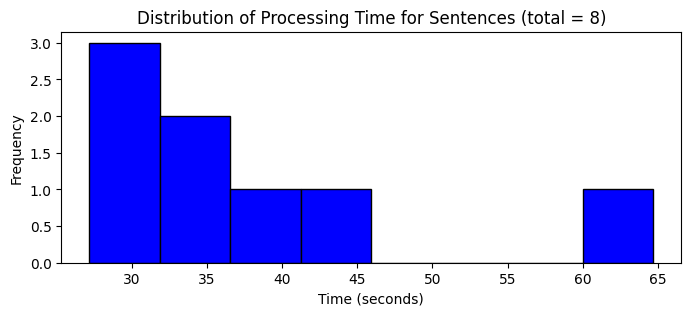

In [ ]:
plt.figure(figsize=(8,3))
plt.hist(all_times, bins=len(sentences), color='blue', edgecolor='black')
plt.title(f'Distribution of Processing Time for Sentences (total = {len(sentences)})')
plt.xlabel('Time (seconds)')
plt.ylabel('Frequency');

#  Slice array function


- Bark  sometimes barks something very weird at the end of the sentence.


- So it is sometimes necessary to clean the audio (noise) that was added at the end of the file.
- To achieve this, we'll **segment the array using** a straightforward criterion that relies on the **amplitude values across consecutive time steps**. The visualizations and plots in the inference section can offer insights into strategies for audio cleaning.
- We can tune the parameters on CFG class (amplitude threshold, time steps, ignore steps).
- **This function attempts to remove the noise generated at the end of each audio.**

In [ ]:
def slice_array_wave(input_array, amplitude_threshold, time_threshold, ignore_initial_steps=0):
    """
    Slice an input array based on consecutive low amplitude values.

    Parameters:
    - input_array (numpy.ndarray): Input array containing amplitude values.
    - amplitude_threshold (float): Threshold below which amplitudes are considered low.
    - time_threshold (int): Number of consecutive low amplitude values needed to trigger slicing.
    - ignore_initial_steps (int, optional): Number of initial steps to ignore before checking for consecutive low amplitudes.

    Returns:
    numpy.ndarray: Sliced array up to the point where consecutive low amplitudes reach the specified time_threshold.
    """

    low_amplitude_indices = np.abs(input_array) < amplitude_threshold

    consecutive_count = 0
    for i, is_low_amplitude in enumerate(low_amplitude_indices[ignore_initial_steps:]):
        if is_low_amplitude:
            consecutive_count += 1
        else:
            consecutive_count = 0

        if consecutive_count >= time_threshold:
#             return input_array[:i - time_threshold]
#             return input_array[:i - int(time_threshold/2) + int(time_threshold/4)]
            return input_array[:i + int(time_threshold/4)]

    return input_array

#  Final Audio

- Slice waves
- Concatenate waves

In [ ]:
%%time
### Concatenate results for each batch
concatenated_array  = np.array([])

# Define sample_rate outside the loop
sample_rate = model.generation_config.sample_rate # 24_000

for audio_number, sentence_audio in enumerate(all_audio_arrays):

    print(f'Audio {audio_number + 1}/{len(all_audio_arrays)}')

    ### concat audio arrays
    current_array = all_audio_arrays[audio_number].squeeze()

    ### post-processed array (remove padding in inference was done in batches)
    current_array = slice_array_wave(
        input_array = current_array,
        amplitude_threshold = CFG.AMPLITUDE_THRESHOLD,
        time_threshold = CFG.TIME_THRESHOLD,
        ignore_initial_steps = CFG.IGNORE_INITIAL_STEPS
    )

    concatenated_array = np.concatenate([concatenated_array, current_array])

### display the concatenated audio
display(Audio(data=concatenated_array, rate=sample_rate)) # normal speed

### save as np.array
np.save(f'./final_audio_sr_{sample_rate}.npy', concatenated_array)

### save as .wav file
write(
    f'./final_audio_sr_{sample_rate}.wav',
    rate = sample_rate,
    data = concatenated_array
  )

Audio 1/8
Audio 2/8
Audio 3/8
Audio 4/8
Audio 5/8
Audio 6/8
Audio 7/8
Audio 8/8


CPU times: user 250 ms, sys: 20.8 ms, total: 271 ms
Wall time: 309 ms


In [ ]:
### checking if array was loaded succesfully
loaded_array = np.load('./final_audio_sr_24000.npy')
display(Audio(data=loaded_array, rate=sample_rate))

In [ ]:
sentences

['In Greek mythology, there are multiple stories associated with the constellation Cancer, but one prominent tale involves the second labor of Heracles (Hercules in Roman mythology)..',
 'Hera, the wife of Zeus and the goddess of marriage, held a grudge against Heracles because he was the illegitimate son of Zeus and another woman..',
 'To harm Heracles, Hera sent a giant crab named Karkinos to distract him during his battle with the Hydra, a serpent with multiple heads..',
 'As Heracles was fighting the Hydra, Karkinos latched onto his foot with its strong pincers..',
 'However, Heracles quickly crushed the crab with his foot, killing it..',
 "In recognition of Karkinos' loyalty and sacrifice, Hera placed the crab in the night sky as the constellation Cancer..",
 'This was her way of honoring the creature that tried to thwart Heracles in his quest..',
 'The Cancer constellation is often depicted as a crab in various interpretations of this myth..']

In [ ]:
text_to_infer

"\nIn Greek mythology, there are multiple stories associated with the constellation Cancer, but one prominent tale involves the second labor of Heracles (Hercules in Roman mythology). Hera, the wife of Zeus and the goddess of marriage, held a grudge against Heracles because he was the illegitimate son of Zeus and another woman. To harm Heracles, Hera sent a giant crab named Karkinos to distract him during his battle with the Hydra, a serpent with multiple heads.\n\nAs Heracles was fighting the Hydra, Karkinos latched onto his foot with its strong pincers. However, Heracles quickly crushed the crab with his foot, killing it. In recognition of Karkinos' loyalty and sacrifice, Hera placed the crab in the night sky as the constellation Cancer. This was her way of honoring the creature that tried to thwart Heracles in his quest. The Cancer constellation is often depicted as a crab in various interpretations of this myth.\n\n"

In [ ]:
concatenated_array.shape

(1135379,)